# Introduction to GPU Programming

## 1. What is GPU?

**GPU**, or Graphics Processing Unit, is a specialized **electronic circuit**.

Originally GPU was developed for computer graphics and image processing, and now GPUs have evolved into general-proposed accelerators for massive parallel computing.

**A comparison of CPU and GPU architecture**

Intel i7 vs. Nvidia A100 vs. AMD MI250
<div>
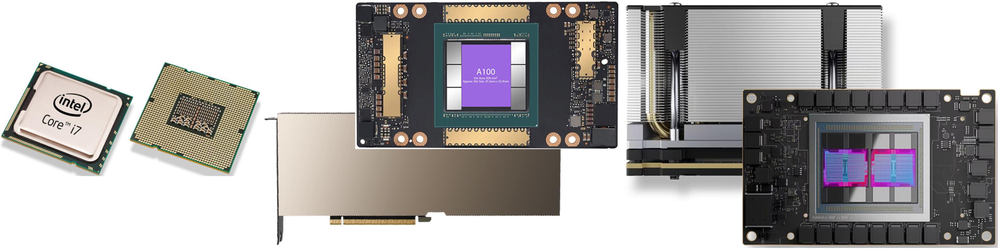
</div>

<div>
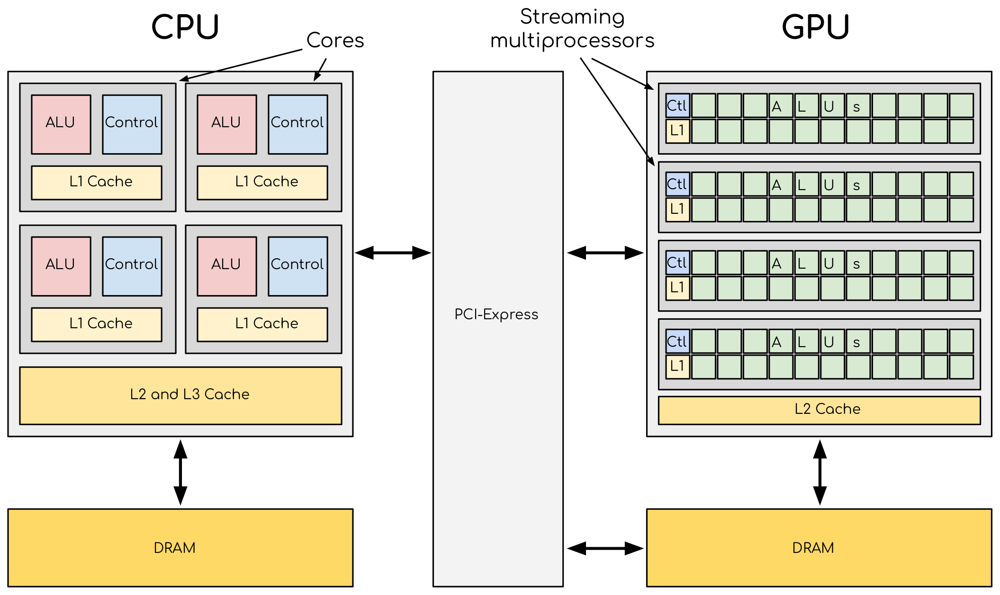
</div>

- Both have similar internal components, including Arithmetic Logic Units (ALUs), memory, and control units.
- CPUs and GPUs are discrete processing components connected by the PCI-Express bus within a single compute node.
    - A GPU is currently not a standalone platform but a co-processor to a CPU.
    - CPU refers to the host and GPU refers to the device.

|   | CPU | GPU |
| - | :-: | :-: |
| Structures | CPU has complex core structure and dedicate large area to cache and control units | GPU cores are very simple, but can pack hundreds of arithmetic logic units on a single chip to achieve high compute density |
| Functions  | CPUs have powerful control units and can radidly switch between different instructions | GPU cores are less powerful than CPU cores and have less memory, but excel in parallel processing of simple and repeating tasks through hundreds of ALUs |
|            | data caching and flow control | (parallel) data processing | 

**GPU platforms**

GPUs come together with software stacks or APIs.

NVIDIA, AMD, and Intel are major companies which design and produces GPUs with their own APIs (**CUDA**, **ROCm**, and **oneAPI**). These APIs provide a standard way for software to interact with GPU hardware to achieve a better performance and profitability of GPU code.

Typically, APIs provide access to functionalities at varied levels.
- low-level: memory management, data transfer between CPU and GPU, and scheduling and execution of parallel processing tasks on GPU
- high-level: modules and libraries optimized for specific HPC workloads
- debugging/profiling tools to optimize codes

There are also cross-platform APIs such **DirectCompute**, **OpenCL**, and **SYCL**.

**Top 10 HPCs**

<div>
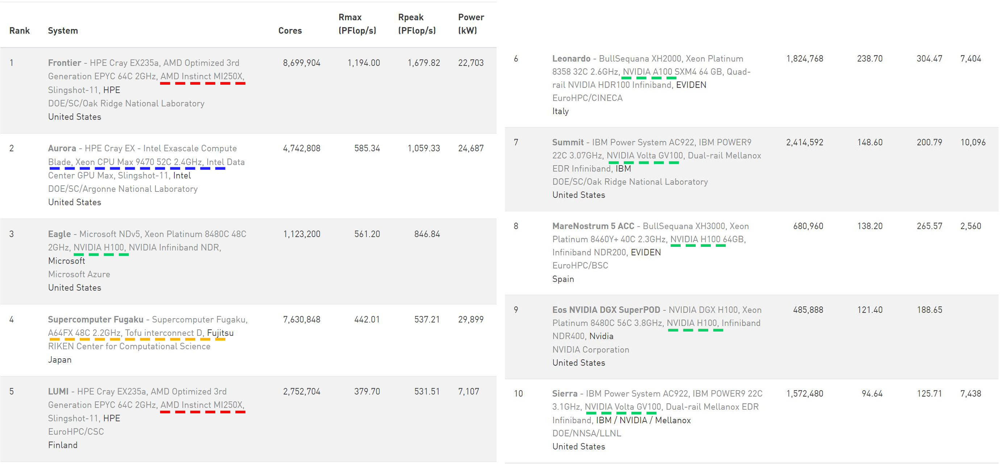
</div>

## 2. GPU programming 

**GPU programming** does not mean to replace CPU with GPU for computing. In fact, it combines CPU and GPU, in which CPUs take the control-intensive tasks, and GPUs are responsible for data-parallel computation-intensive tasks.

GPU programming is well-suited to problems that involve large amounts of data parallelism.
- _Graphics rendering, computer vision, and computer games_
- _Large-scale matrix, vector operations, Fourier transforms, and Convolutional neural networks_
- _Molecular dynamics and Monte Carlo simulations, and Computational fluid dynamics_
- _Cloud and quantum computing_

## 3. GPU programming models

Representative GPU programming software environments and APIs include
- **directive-based models**
- **non-portable kernel-based models**
- **portable kernel-based models**
- **high-level language programming frameworks and libraries**

### 3.1 Standard C/C++ and Fortran

Programs written in standard C/C++ and Fortran languages can now take advantage of GPUs without depending on any external library. The developers should know more about GPU architectures as GPU programming is totally different to that of CPU programming.

### 3.2 Directive-based programming model

In this model, the existing serial code is annotated with directives, which tells the compiler that specific loops and regions should be executed on GPU.

Two representative directives-based programming models are **OpenACC** and **OpenMP**.
- [OpenACC](https://www.openacc.org/) is developed by a consortium formed in 2010 with the goal of developing a standard, portable, and scalable programming model for accelerators, including GPUs. Members of the OpenACC consortium include GPU vendors, such as NVIDIA and AMD, as well as leading supercomputing centers, universities, and software companies.
- [OpenMP](https://www.openmp.org/) starts a multi-platform, shared-memory parallel programming API for multi-core CPUs and adds relatively recently support for GPU offloading.

The directive-based models work with both C/C++ (left) and FORTRAN (right) codes, and there are also third party extensions to support other programming languages.

<div>
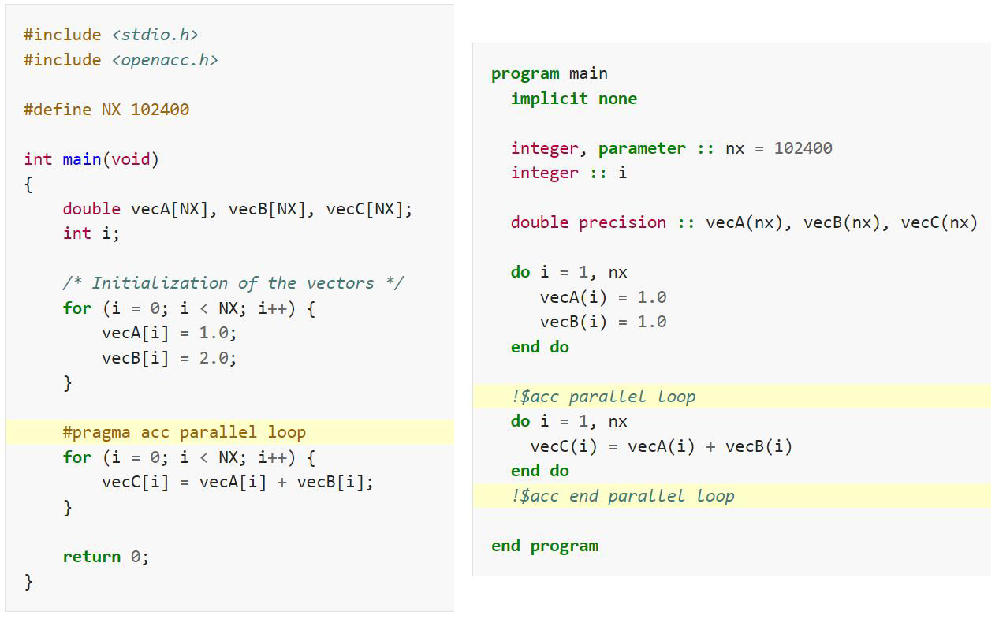
</div>

This programming model is straightforward and easy to implement (but to the detriment of performance), and it allows employing accelerators with minimum programming effort by adding parallelism to existing code without the need to write accelerator-specific code.

### 3.3 Non-portable kernel-based models (native programming models)

In these programming models, the developer has a large level of control of the hardware by writing low-level code that directly communicates with GPU and its hardware. This requires a deep understanding of GPU architecture and its capabilities, as well as the specific programming method being used

Two representative programmng platforms are CUDA and HIP.
- [CUDA](https://developer.nvidia.com/cuda-toolkit) is a parallel computing platform and API developed by Nvidia. It allows developers to write C++-like code that is executed on Nvidia GPU. CUDA provides a set of libraries and tools for low-level GPU programming and provides a performance boost for demanding computationally-intensive applications.
- [HIP](https://rocm.docs.amd.com/projects/HIP/en/latest/) (Heterogeneous Interface for Portability) is an API developed by AMD that provides a low-level interface for GPU programming. HIP is designed to provide a single source code that can be used on both NVIDIA and AMD GPUs. It is based on the CUDA programming model and provides an almost identical programming interface to CUDA.

Code example for vector addition using CUDA.
<div>
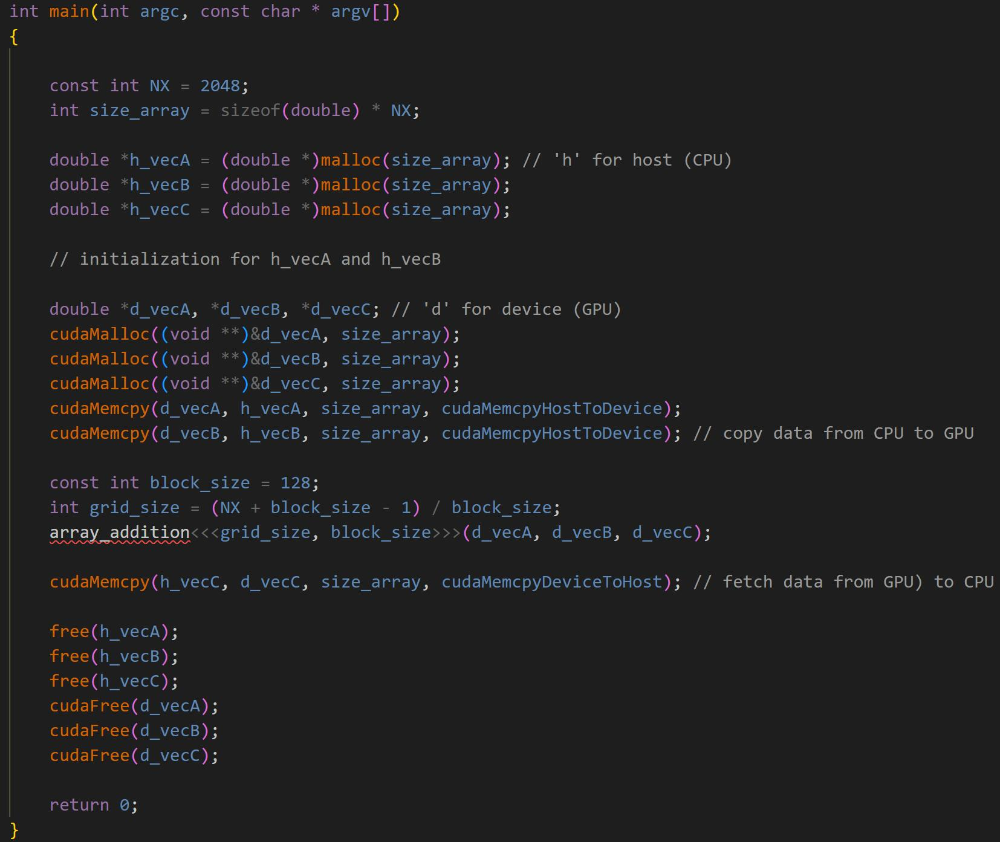
</div>

### 3.4 Portable kernel-based models (cross-platform portability ecosystems)

Cross-platform portability ecosystems typically provide a higher-level abstraction layer which provide a convenient and portable programming model for GPU programming. The goal of these ecosystems is achieving performance portability with a single-source application.

For C++, the most notable cross-platform portability ecosystems are [**Alpaka**](https://github.com/alpaka-group/alpaka), [**Kokkos**](https://github.com/kokkos/kokkos), [**OpenCL**](https://www.khronos.org/opencl/), and [**SYCL**](https://www.khronos.org/sycl/).
- **Alpaka** library is a header-only C++17 abstraction library for accelerator development. This library defines and implements an abstract interface for the hierarchical redundant parallelism model. This model exploits task- and data-parallelism as well as memory hierarchies at all levels of current multi-core architectures. All hardware types (CPUs, GPUs and other accelerators) are treated and can be programmed in the same way. The alpaka library provides back-ends for CUDA, OpenMP, HIP, SYCL and other technologies.
- **Kokkos** is an open-source performance portable programming model for heterogeneous parallel computing. It is a C++-based ecosystem that provides a programming model for developing efficient and scalable parallel applications that run on many-core architectures such as CPUs, GPUs, and FPGAs. The Kokkos ecosystem consists of several components, such as the Kokkos core library, which provides parallel execution and memory abstraction, the Kokkos kernels library, which provides math kernels for linear algebra and graph algorithms, and the Kokkos tools library, which provides profiling and debugging tools. Kokkos components integrate well with other software libraries and technologies, such as MPI and OpenMP.
- **OpenCL** (Open Computing Language) is a cross-platform, open-standard API for general-purpose parallel computing on CPUs, GPUs and FPGAs. It supports a wide range of hardware from multiple vendors. OpenCL provides a low-level programming interface for GPU programming and enables developers to write programs that can be executed on a variety of platforms.
- **SYCL** is a royalty-free, open-standard C++ programming model for multi-device programming. It provides a high-level, single-source programming model for heterogeneous systems, including GPUs. It can be implemented on top of other low-level heterogeneous computing APIs, such as CUDA or HIP, enabling developers to write programs that can be executed on a variety of platforms.

### 3.5 High-level language programming frameworks and libraries

**Python** and **Julia** offer both high-level abstractions that require very little programming effort and a lower level approach for writing kernels for fine-grained control.